O seguinte projeto tem por objetivo realizar uma análise exploratória de dados de um arquivo contendo dados de vendas de imóveis da cidade de Seattle, nos EUA. 

# 1.0 Análise Exploratória dos Dados (EDA)

## 1.1 Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import plotly.express as px

## 1.2 Load Data

In [2]:
data = pd.read_csv(r'C:\Users\jota_\Repositorios\curso_python_0_ao_DS\datasets\kc_house_data.csv')

## 1.3 Entendendo os dados

**Significado das colunas**
- id - ID único para cada casa vendida;
- date - Data da venda;
- price - Preço da casa vendida;
- bedrooms - Número de quartos;
- bathrooms - Número de banheiros, onde .5 significa um banheiro com toalete mas sem chuveiro;
- sqft_living - Medida da área habitável do imóvel, em pés quadrados;
- sqft_lot - Medida da área do imóvel, em pés quadrados;
- floors - Número de andares;
- waterfront - Variável binária em que 1 significa que o imóvel tem vista para a água, e 0 que não a tem;
- view - Variável qualitativa que representa o quão agradável é a vista do imóvel, de 0 a 4;
- condition - Variável qualitativa que representa o quão boa é a condição do imóvel, de 1 a 5;
- grade - Variável qualitativa que representa a nota do nível de construção e design do imóvel, em que 1-3 é insatisfatório, 4-10 é um nível mediano e 11-13 representa um alto nível;
- sqft_above - Medida da área construída do imóvel acima do nível do solo, em pés quadrados;
- sqft_basement - Medida da área construída do imóvel abaixo do nível do solo, em pés quadrados;
- yr_built - Ano de construção do imóvel;
- yr_renovated - Ano da última reforma no imóvel;
- zipcode - CEP do imóvel;
- lat - Latitude;
- long - Longitude;
- sqft_living15 - Medida da área habitável dos 15 imóveis mais próximos, em pés quadrados;
- sqft_lot15 - Medida da área dos 15 imóveis mais próximos, em pés quadrados.

In [3]:
data.sample(8)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
2183,4058802105,20140904T000000,150000.0,3,1.00,1450,6776,1.0,0,0,...,7,1450,0,1952,0,98178,47.5056,-122.244,1680,7200
17779,9285800180,20140626T000000,900000.0,4,3.50,3370,5000,2.0,0,2,...,8,2470,900,2008,0,98126,47.5714,-122.380,1820,5000
17973,4037200690,20141208T000000,458450.0,4,1.00,1330,9715,1.0,0,0,...,7,970,360,1957,0,98008,47.6038,-122.122,1590,8400
2099,6414100111,20141105T000000,365000.0,2,1.00,990,9223,1.0,0,0,...,7,990,0,1949,0,98125,47.7200,-122.320,1230,7244
15315,9122500080,20150428T000000,275000.0,5,2.00,2260,11970,1.0,0,0,...,7,1250,1010,1962,0,98031,47.3896,-122.218,1950,11970
17220,3626039028,20140818T000000,417500.0,3,1.00,1160,7491,1.0,0,0,...,6,1160,0,1917,0,98177,47.7024,-122.359,1800,2267
12460,2025079045,20140623T000000,649000.0,2,1.75,2260,280962,2.0,0,2,...,9,1890,370,2005,0,98014,47.6359,-121.940,2860,219542
18096,7349400100,20141009T000000,279950.0,3,1.75,1930,7267,1.0,0,0,...,7,1330,600,1977,0,98002,47.3217,-122.205,1600,7698


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

## 1.4 Resumo Estatístico

In [5]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00
mean,4580301520.86,540088.14,3.37,2.11,2079.90,15106.97,1.49,0.01,0.23,3.41,7.66,1788.39,291.51,1971.01,84.40,98077.94,47.56,-122.21,1986.55,12768.46
std,2876565571.31,367127.20,0.93,0.77,918.44,41420.51,0.54,0.09,0.77,0.65,1.18,828.09,442.58,29.37,401.68,53.51,0.14,0.14,685.39,27304.18
min,1000102.00,75000.00,0.00,0.00,290.00,520.00,1.00,0.00,0.00,1.00,1.00,290.00,0.00,1900.00,0.00,98001.00,47.16,-122.52,399.00,651.00
25%,2123049194.00,321950.00,3.00,1.75,1427.00,5040.00,1.00,0.00,0.00,3.00,7.00,1190.00,0.00,1951.00,0.00,98033.00,47.47,-122.33,1490.00,5100.00
50%,3904930410.00,450000.00,3.00,2.25,1910.00,7618.00,1.50,0.00,0.00,3.00,7.00,1560.00,0.00,1975.00,0.00,98065.00,47.57,-122.23,1840.00,7620.00
75%,7308900445.00,645000.00,4.00,2.50,2550.00,10688.00,2.00,0.00,0.00,4.00,8.00,2210.00,560.00,1997.00,0.00,98118.00,47.68,-122.12,2360.00,10083.00
max,9900000190.00,7700000.00,33.00,8.00,13540.00,1651359.00,3.50,1.00,4.00,5.00,13.00,9410.00,4820.00,2015.00,2015.00,98199.00,47.78,-121.31,6210.00,871200.00


## 1.5 Análise das Relações das Variáveis de Interesse

### Analisando a variável alvo ('price')

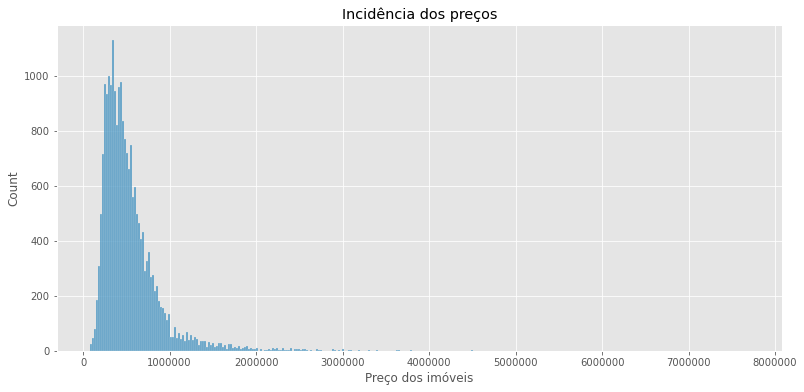

In [6]:
plt.style.use('ggplot')
plt.figure(figsize=(13,6))
sns.histplot(data=data, x='price')
plt.xlabel('Preço dos imóveis')
plt.ylabel('Frequência')
plt.title('Incidência dos preços')
plt.ticklabel_format(style='plain')

O histograma nos mostra qual a faixa de preço mais frequente entre os imóveis. No caso desse dataset, fica clara a assimetria dos preços, que aparentam ficar exponencialmente mais caros conforme outros fatores. Esta assimetria se repetirá ao analisarmos outras variáveis no decorrer deste projeto. Devido a baixíssima frequência das observações do preço mais caro, faz-se útil utilizarmos outro tipo de gráfico:

<AxesSubplot:>

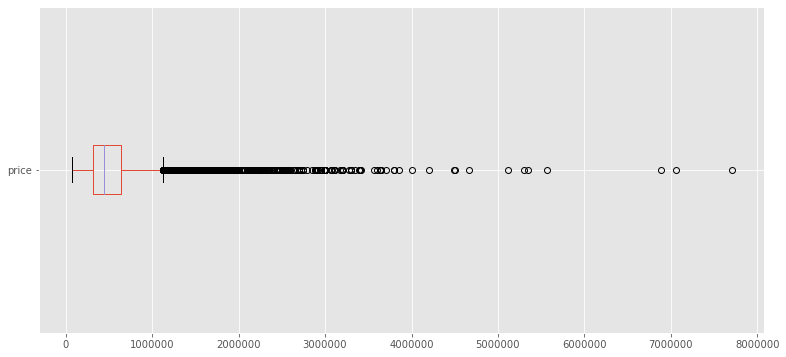

In [7]:
plt.figure(figsize=(13,6))
plt.ticklabel_format(style='plain')
data['price'].plot.box(vert=False)

O grafico boxplot nos ilustra muito bem a quantidade de imoveis que possuem determinada faixa de preço, e deixa claro a desproporcionalidade dos preços dos imóveis quanto mais caros ficam.

### Analisando outras propriedades dos imóveis deste dataset


Text(0.5, 1.0, 'Year Built')

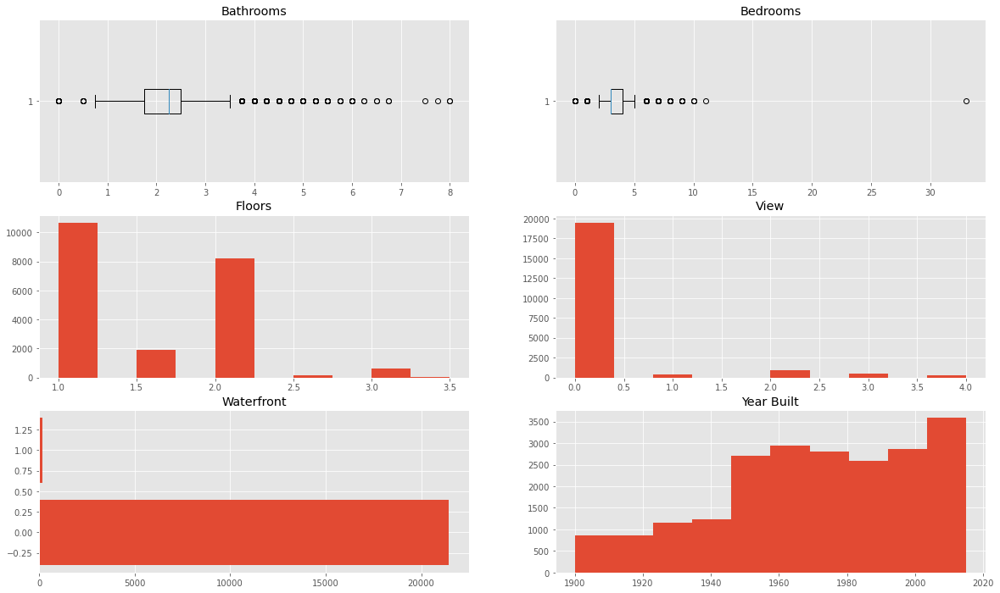

In [8]:
fig = plt.figure(figsize=(20,12))
specs = gridspec.GridSpec(ncols=2, nrows=3, figure=fig)

ax1 = fig.add_subplot(specs[0, 0]) #first row first column
ax2 = fig.add_subplot(specs[0, 1]) #first row second column
ax3 = fig.add_subplot(specs[1, 0]) #second row first column
ax4 = fig.add_subplot(specs[1, 1]) #second row second column
ax5 = fig.add_subplot(specs[2, 0]) #third row first column
ax6 = fig.add_subplot(specs[2, 1]) #third row second column

# primeiro grafico bathrooms
ax1.boxplot(data['bathrooms'], vert=False)
ax1.set_title('Bathrooms')

# segundo grafico bedrooms
ax2.boxplot(data['bedrooms'], vert=False)
ax2.set_title('Bedrooms')

# terceiro grafico floors
ax3.hist(data['floors'])
ax3.set_title('Floors')

# quarto grafico view
ax4.hist(data['view'])
ax4.set_title('View')

# quinto grafico waterfront
ax5_var = data[['waterfront', 'id']].groupby('waterfront').count().reset_index()
ax5.barh(ax5_var['waterfront'], ax5_var['id'])
ax5.set_title('Waterfront')

# sexto grafico yr_built
ax6.hist(data['yr_built'])
ax6.set_title('Year Built')

- Através do gráfico boxplot podemos ver que a coluna "Bathrooms" apresenta uma distribuição similar às outras variáveis, que possuem cauda direita mais alongada, ou seja, as casas com mais banheiros são menos frequentes. No decorrer desta análise poderemos ver também que essa assimetria está relacionada com outras variáveis, como tamanho de terreno e preço, por exemplo;
- Digno de nota na coluna "Bedrooms" temos o fato de podermos observar apenas uma casa com 33 quartos, provavelmente uma mansão;
- O gráfico de barras ilustra perfeitamente a incidência de determinados tamanhos de residências no gráfico "Floors", em que imóveis com um e dois andares são mais frequentes e tamanhos maiores ou irregulares são menos;
- A variável "View" demonstra uma curiosidade sobre este dataset: A imensa maioria dos imóveis não possuem uma vista agradável e apenas uma pequena parcela possui esse diferencial, que pode ser muito bem explorado durante a venda;
- O gráfico "Waterfront" também possui outra curiosidade: apesar da cidade de Seattle possuir vários rios e braços do mar, o dataset não tem muitas residências de frente para a água. O que é lamentável, pois estes imóveis tendem a ter um preço bem mais interessante e rentável;
- A curiosidade demonstrada pelo gráfico "Year Built" demonstra a dinâmica da própria expansão da cidade ao longo do tempo, item que será explorado mais à frente nesta análise.

### Distribuição dos tamanhos dos imóveis, com as colunas sqft_living, lot, above e basement


Text(0.5, 1.0, 'Below Ground Level')

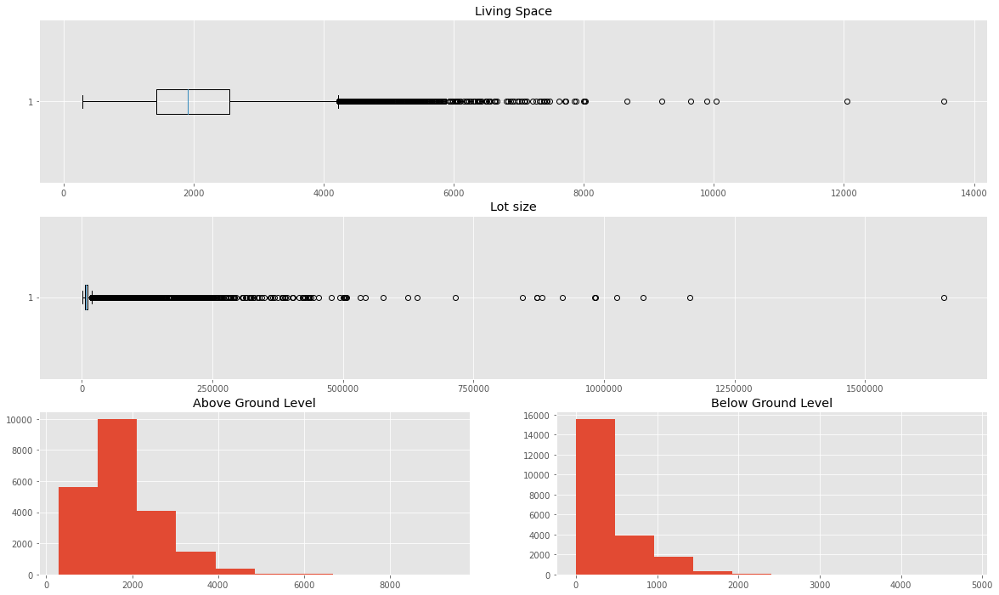

In [22]:
fig = plt.figure(figsize=(20,12))
specs = gridspec.GridSpec(ncols=2, nrows=3, figure=fig)

ax1 = fig.add_subplot(specs[0, :]) #first row 
ax2 = fig.add_subplot(specs[1, :]) #second row 
ax3 = fig.add_subplot(specs[2, 0]) #third row first column
ax4 = fig.add_subplot(specs[2, 1]) #third row second column

# primeiro grafico sqft_living
ax1.boxplot(data['sqft_living'], vert=False) 
ax1.set_title('Living Space')

# segundo grafico sqft_lot
ax2.ticklabel_format(style='plain')
ax2.boxplot(data['sqft_lot'], vert=False)
ax2.set_title('Lot size')

# terceiro grafico sqft_above
ax3.hist(data['sqft_above'])                
ax3.set_title('Above Ground Level')

# quarto grafico sqft_basement
ax4.hist(data['sqft_basement'])
ax4.set_title('Below Ground Level')

- Os gráficos que especificam o tamanho dos imóveis, como o "Living Space", seguem uma linha muito próxima dos gráficos dos preços, com os quartis seguindo a mesma proporção e um grande numero de outliers, além do fato dos valores desses outliers excederem em mais de 100% dos valores do restante da série;
- O gráfico "Lot Size" é o mais destoante dos demais, apesar de seguir o mesmo padrâo das outras variáveis, os outliers são muito maiores, excedendo o restante das observações em mais de 42 vezes;
- Em "Above Ground Level", observamos um grafico com distribuição similar ao "Living Space", o que já era esperado;
- O gráfico "Below Ground Level" evidencia claramente a proporção de imóveis sem porão, além de demonstrar o quão grandes podem ficar os porões neste dataset, que como observado no Resumo Estatístico, possui seu valor máximo como quatro mil oitocentos e vinte pés quadrados, o que equivale a aproximadamente 448 metros quadrados, um porão bem vistoso, na minha opinião.

### Analisando a qualidade dos imóveis

(array([   30.,     0.,   172.,     0.,     0., 14031.,     0.,  5679.,
           0.,  1701.]), array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]), <BarContainer object of 10 artists>)
   condition     id
0          1     30
1          2    172
2          3  14031
3          4   5679
4          5   1701


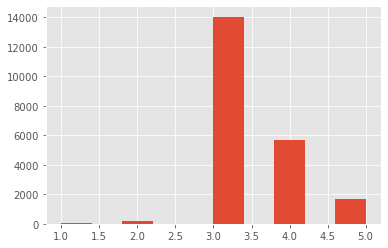

In [10]:
cond_sum = data[['condition', 'id']].groupby('condition').count().reset_index()
print(plt.hist(data['condition']))
print(cond_sum)

Esta variável representa a condição da estrutura dos imóveis. Aqui temos informações importantíssimas para estabelecermos a estratégia de um possível negócio que utilizaria este dataset, que é ter noção da proporção de imóveis que precisam de reforma antes de serem revendidos e qual é a urgência dessa reforma. Pelo que o gráfico demonstra, poucos imóveis precisam de uma reforma urgente, mas na maioria dos casos (observação 3) uma reforma seria de bom tom.

(array([1.0000e+00, 3.0000e+00, 2.9000e+01, 2.4200e+02, 2.0380e+03,
       1.5049e+04, 2.6150e+03, 1.1340e+03, 3.9900e+02, 1.0300e+02]), array([ 1. ,  2.2,  3.4,  4.6,  5.8,  7. ,  8.2,  9.4, 10.6, 11.8, 13. ]), <BarContainer object of 10 artists>)
    grade    id
0       1     1
1       3     3
2       4    29
3       5   242
4       6  2038
5       7  8981
6       8  6068
7       9  2615
8      10  1134
9      11   399
10     12    90
11     13    13


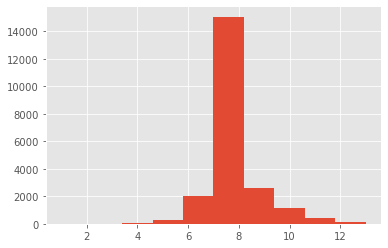

In [11]:
grade_sum = data[['grade', 'id']].groupby('grade').count().reset_index()
print(plt.hist(data['grade']))
print(grade_sum)

Outra métrica importantíssima para precificação é observar o nível de design e construção dos imóveis, que como podemos observar estão densamente concentrados no nível "7". A partir dessa observação podemos definir a viabilidade de focar em algum nicho específico de consumidores ou seguir uma linha mais abrangente. Conforme o gráfico demonstra, mais de 60% dos imóveis possuem nível mediano, portanto uma estratégia de nicho (como focar em imóveis de luxo) não seria tão interessante, pois isso limitaria muito as opções do nosso portifólio, tanto quanto à localização quanto a outras questões de extrema importância na hora de negociar com possíveis clientes.

<BarContainer object of 12 artists>
    grade      price
0       1  142000.00
1       3  205666.67
2       4  214381.03
3       5  248523.97
4       6  301919.64
5       7  402590.26
6       8  542852.77
7       9  773513.19
8      10 1071771.07
9      11 1496841.73
10     12 2191222.00
11     13 3709615.38


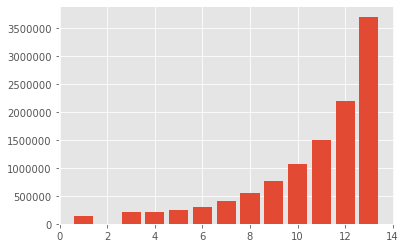

In [12]:
grade_mean = data[['grade', 'price']].groupby('grade').mean().reset_index()
graph = plt.bar(x=grade_mean['grade'], height=grade_mean['price'])
plt.ticklabel_format(style='plain')
print(graph)
print(grade_mean)

Aqui temos uma melhor visualização da relação entre a coluna 'grade' e a média do preço dos imóveis.

### Avaliando como variaveis de tempo interagem com o preço

<BarContainer object of 116 artists>

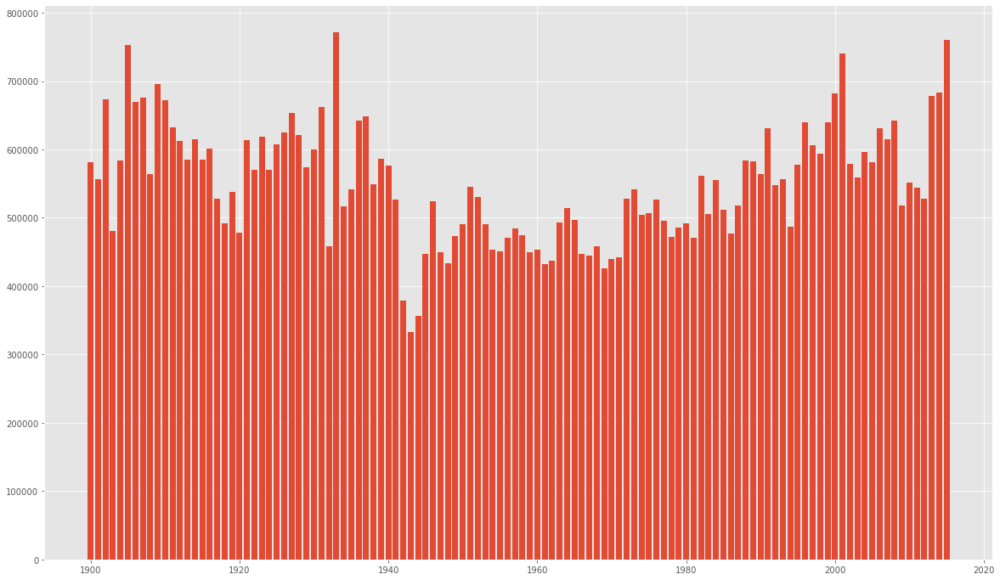

In [13]:
year_mean = data[['yr_built', 'price']].groupby('yr_built').mean().reset_index()
plt.figure(figsize=(20,12))
plt.bar(year_mean['yr_built'], year_mean['price'])

Como demonstra o gráfico, o valor dos imóveis vendidos parece não ter correlação com o ano em que eles foram construídos, pois temos imóveis antigos que foram vendidos a preços elevados, assim como recentes. Porém sabemos que existem outros fatores que possuem relação com o preço. Vejamos se o gráfico vai mudar se isolarmos uma das 'grades':

<BarContainer object of 115 artists>

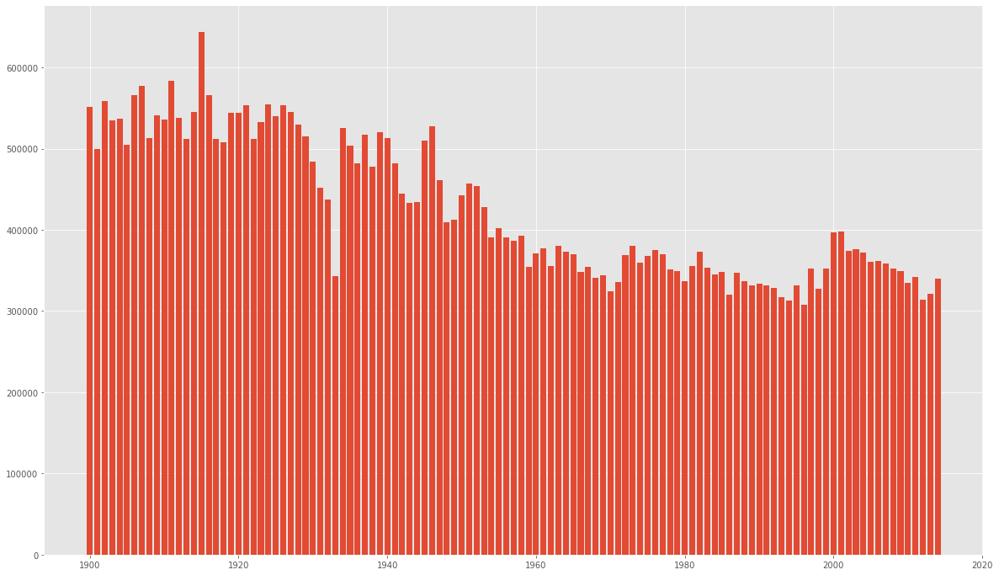

In [14]:
df_aux = data[data['grade'] == 7]
year_mean = df_aux[['yr_built', 'price']].groupby('yr_built').mean().reset_index()
plt.figure(figsize=(20, 12))
plt.bar(year_mean['yr_built'], year_mean['price'])

A partir dessa observação temos um dado mais interessante e contraintuitivo. Por quê os imóveis mais antigos são mais caros? Vejamos qual será o comportamento dos dados observando outras métricas correlacionadas com o preço:

In [15]:
df_aux1 = df_aux[df_aux['yr_renovated'] == 0]
df_aux2 = df_aux[df_aux['yr_renovated'] > 0]

#imóveis sem reforma (para comparação)
year_mean = df_aux1[['yr_built', 'price']].groupby('yr_built').mean().reset_index()
#imóveis reformados
year_mean_renov = df_aux2[['yr_built', 'price']].groupby('yr_built').mean().reset_index()
#separado por condição
cond_mean = df_aux[['yr_built', 'condition']].groupby('yr_built').mean().reset_index()
#separado por tamanho de área construída
size_mean = df_aux[['yr_built', 'sqft_living']].groupby('yr_built').mean().reset_index()
#separado por quantidade de andares
floors_mean = df_aux[['yr_built', 'floors']].groupby('yr_built').mean().reset_index()
#separado por quantidade de quartos
bed_mean = df_aux[['yr_built', 'bedrooms']].groupby('yr_built').mean().reset_index()
#separado por quantidade de banheiros
bath_mean = df_aux[['yr_built', 'bathrooms']].groupby('yr_built').mean().reset_index()

Text(0.5, 1.0, 'Número de banheiros')

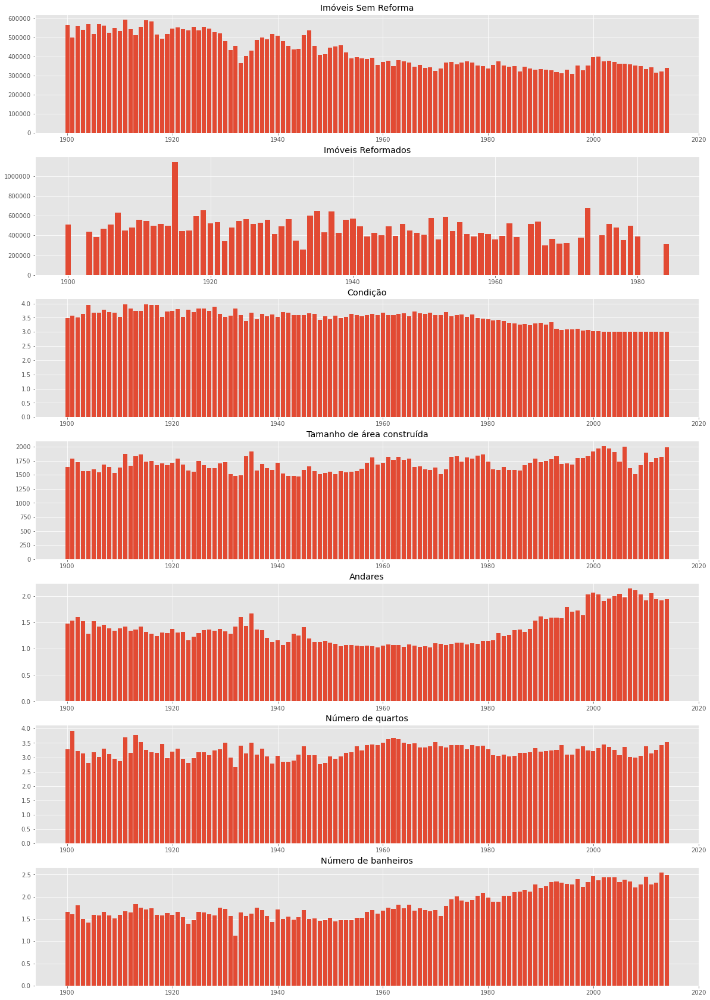

In [23]:
fig = plt.figure(figsize=(20,30))
specs = gridspec.GridSpec(ncols=1, nrows=7, figure=fig)

ax1 = fig.add_subplot(specs[0, :]) #first row 
ax2 = fig.add_subplot(specs[1, :]) #second row 
ax3 = fig.add_subplot(specs[2, :]) #third row 
ax4 = fig.add_subplot(specs[3, :]) #fourth row 
ax5 = fig.add_subplot(specs[4, :]) #fifth row 
ax6 = fig.add_subplot(specs[5, :]) #sixth row 
ax7 = fig.add_subplot(specs[6, :]) #seventh row 


# primeiro grafico imóveis sem reforma
ax1.bar(year_mean['yr_built'], year_mean['price']) 
ax1.set_title('Imóveis Sem Reforma')

# segundo grafico imóveis com reforma
ax2.ticklabel_format(style='plain')
ax2.bar(year_mean_renov['yr_built'], year_mean_renov['price'])
ax2.set_title('Imóveis Reformados')

# terceiro grafico condições
ax3.bar(cond_mean['yr_built'], cond_mean['condition']) 
ax3.set_title('Condição')

# quarto grafico tamanho da área construída
ax4.bar(size_mean['yr_built'], size_mean['sqft_living'])
ax4.set_title('Tamanho de área construída')

# quinto grafico andares
ax5.bar(floors_mean['yr_built'], floors_mean['floors'])
ax5.set_title('Andares')

# sexto grafico número de quartos
ax6.bar(bed_mean['yr_built'], bed_mean['bedrooms'])
ax6.set_title('Número de quartos')

# sétimo grafico número de banheiros
ax7.bar(bath_mean['yr_built'], bath_mean['bathrooms'])
ax7.set_title('Número de banheiros')

Text(0.5, 1.0, 'Número de banheiros')

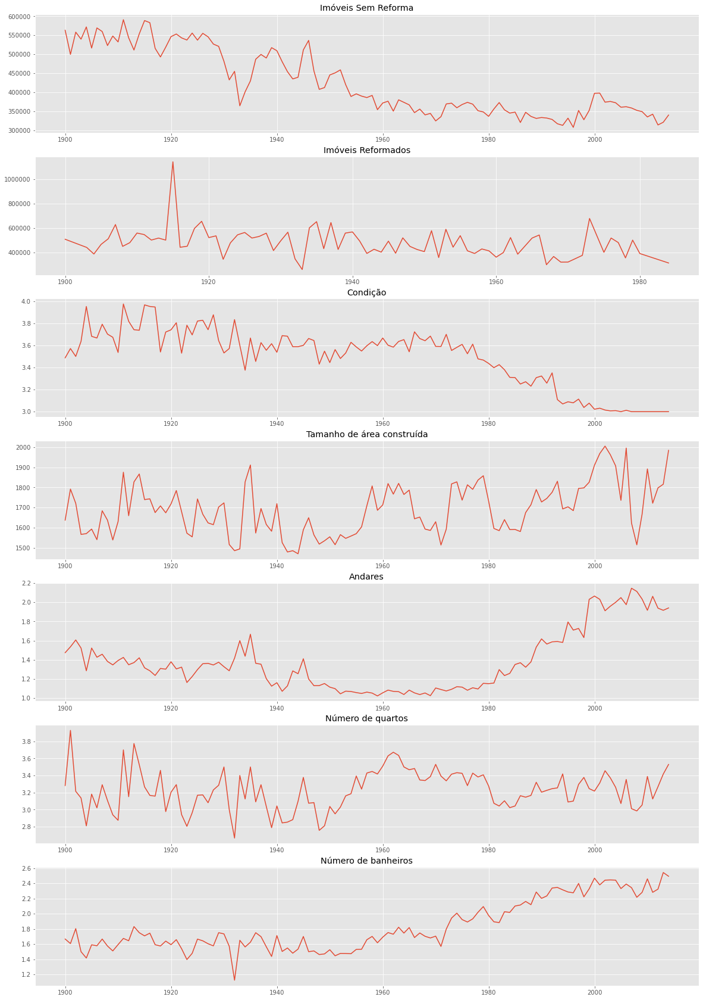

In [25]:
fig = plt.figure(figsize=(20,30))
specs = gridspec.GridSpec(ncols=1, nrows=7, figure=fig)

ax1 = fig.add_subplot(specs[0, :]) #first row 
ax2 = fig.add_subplot(specs[1, :]) #second row 
ax3 = fig.add_subplot(specs[2, :]) #third row 
ax4 = fig.add_subplot(specs[3, :]) #fourth row 
ax5 = fig.add_subplot(specs[4, :]) #fifth row 
ax6 = fig.add_subplot(specs[5, :]) #sixth row 
ax7 = fig.add_subplot(specs[6, :]) #seventh row 


# primeiro grafico imóveis sem reforma
ax1.plot(year_mean['yr_built'], year_mean['price']) 
ax1.set_title('Imóveis Sem Reforma')

# segundo grafico imóveis com reforma
ax2.ticklabel_format(style='plain')
ax2.plot(year_mean_renov['yr_built'], year_mean_renov['price'])
ax2.set_title('Imóveis Reformados')

# terceiro grafico condições
ax3.plot(cond_mean['yr_built'], cond_mean['condition']) 
ax3.set_title('Condição')

# quarto grafico tamanho da área construída
ax4.plot(size_mean['yr_built'], size_mean['sqft_living'])
ax4.set_title('Tamanho de área construída')

# quinto grafico andares
ax5.plot(floors_mean['yr_built'], floors_mean['floors'])
ax5.set_title('Andares')

# sexto grafico número de quartos
ax6.plot(bed_mean['yr_built'], bed_mean['bedrooms'])
ax6.set_title('Número de quartos')

# sétimo grafico número de banheiros
ax7.plot(bath_mean['yr_built'], bath_mean['bathrooms'])
ax7.set_title('Número de banheiros')

Observando a média das outras variáveis pelo ano, podemos notar que apenas a coluna 'condition' aparenta ter correlação com o gráfico 'Imóveis Sem Reforma', descartando minha principal hipótese, que era a de que os altos preços em imóveis mais antigos estariam relacionados com o fato de existirem mais imóveis reformados nesse extrato.

<BarContainer object of 372 artists>

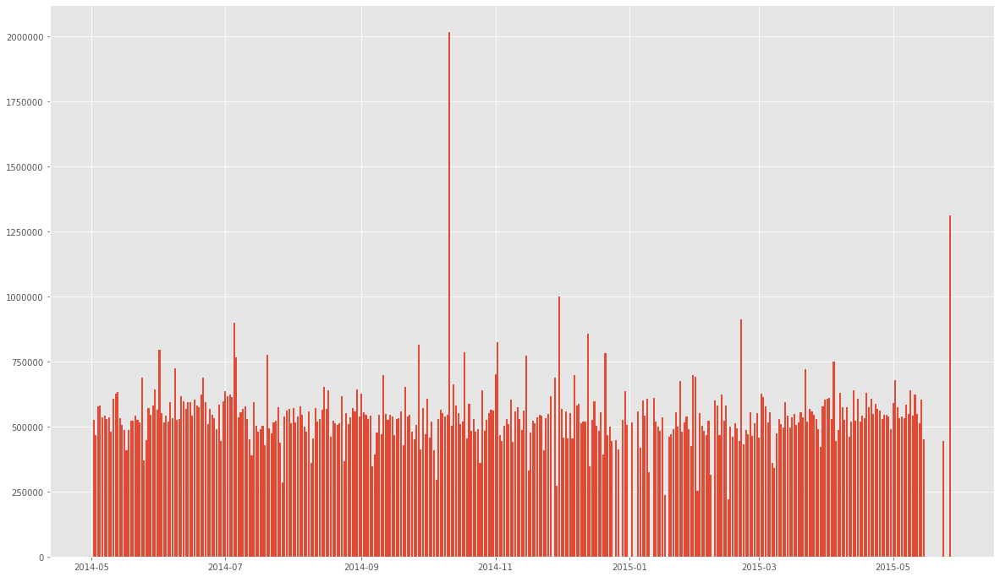

In [17]:
data['day'] = pd.to_datetime(data['date'])
day_sort = data[['price', 'day']].groupby('day').mean().reset_index()
plt.figure(figsize=(20,12))
plt.ticklabel_format(style='plain')
plt.bar(day_sort['day'], day_sort['price'])

Este gráfico mostra a data em que o imóvel foi vendido e a média do preço de cada dia. Um dos fatores que mais altera preços no mercado imobiliário é o aumento progressivo do valor da terra ao longo do tempo, portanto é uma métrica importante a ser observada, apesar dos dados aqui analisados não apresentarem correlação. Vale ressaltar que este dataset abrange apenas um período de pouco mais de um ano, um tempo bastante curto e que provavelmente não compreende fatores que influenciam na mudança dos preços dos imóveis, como aumento no imposto cobrado pela terra, que no estado de Washington sofre reajuste de ano a ano.

## 1.6 Mapeando os Imóveis

In [18]:
most_expensive = data[['id', 'lat', 'long', 'price']]

fig = px.scatter_mapbox(most_expensive,
                       lat = 'lat', 
                       lon = 'long', 
                       size = 'price', 
                       hover_name = 'id',
                       hover_data = ['price'], 
                       color_continuous_scale = px.colors.cyclical.IceFire,
                       size_max = 25,
                       zoom = 10)

fig.update_layout(mapbox_style = 'open-street-map')
fig.update_layout(height=600, margin={'r': 0,'t' :0,'l' :0,'b' :0})

O dataset utilizado neste projeto possui dados geográficos, então nada mais justo que utilizá-los para ter um diferente tipo de visualização nesta análise. O mapa foi construído de forma que as esferas tenham seu tamanho ditado pelo preço dos imóveis, ilustrando as várias formas em que a posição do imóvel influenciará no seu preço. Por exemplo, os imóveis mais próximos de regiões centrais, mais próximos de áreas costeiras e mais próximos de parques costumam ser mais caros.

In [19]:
year_dist = data[['id', 'lat', 'long', 'price', 'yr_built']]

fig = px.scatter_mapbox(year_dist,
                       lat = 'lat', 
                       lon = 'long', 
                       size = 'price', 
                       color = 'yr_built', 
                       hover_name = 'id',
                       hover_data = ['price'], 
                       color_continuous_scale = px.colors.cyclical.IceFire,
                       size_max = 15,
                       zoom = 10)

fig.update_layout(mapbox_style = 'open-street-map')
fig.update_layout(height=600, margin={'r': 0,'t' :0,'l' :0,'b' :0})


Conseguimos extrair uma grande variedade de informações curiosas pela observação dos dados geográficos, como este exemplo, em que as cores ficam mais escuras quanto mais recente é o ano de construção, o que demonstra a expansão da cidade ao longo dos anos. Esta informação pode servir apenas como curiosidade em um primeiro momento, mas pode ser utilizada se tivermos, por ventura, um cliente que tenha preferências arquitetônicas por um bairro mais moderno, ou com arquitetura mais clássica, entre vários outros insights que podemos ter a partir da análise geográfica.

## 1.7 Matriz de Correlação das Variáveis

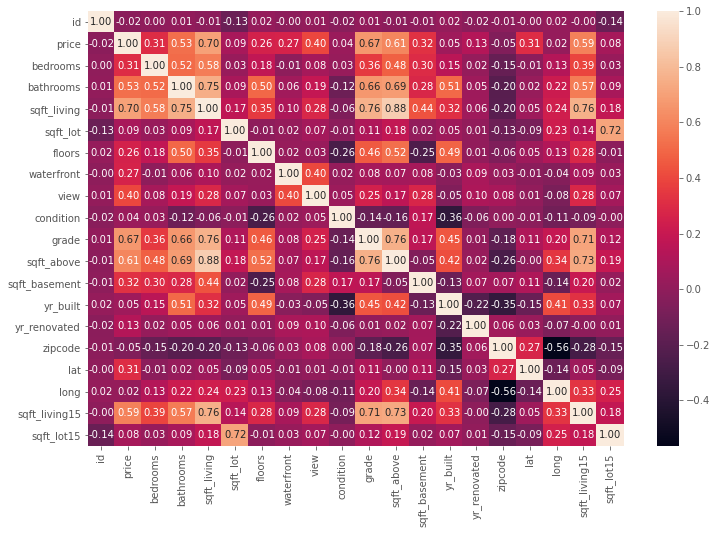

In [20]:
correlation = data.corr(method='pearson')
f = plt.subplots(figsize = (12, 8))
sns.heatmap(correlation, annot=True, fmt='.2f')
plt.show()

Por fim, uma análise de correlação de Pearson das variáveis deste dataset. Algumas informações importantes podem ser retiradas desta tabela, por exemplo o preço ter uma correlação razoavelmente relevante com o tamanho da area construída dos 15 vizinhos mais próximos (colunas 'price' e 'sqft_living15'). Presumo que isso se dê pela relação forte entre tamanho de área construída e preço, que tende a ser similar entre os imóveis de um mesmo bairro.

## 1.8 Conclusão

O objetivo deste projeto é demonstrar alguns conhecimentos em manipulação de dados e em algumas bibliotecas do Python. Também visa revelar a riqueza de informações e insights que podem ser extraídos com as análises corretas, utilizando ferramentas variadas.